In [1]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import scienceplots
plt.style.use("science")
from pymatreader import read_mat
import IPython
from pathlib import Path
from utilities import savefig, FKFit, FitInput, FitResult, perform_fit

In [2]:
NB_NAME = Path(IPython.extract_module_locals()[1]["__vsc_ipynb_file__"]).stem

In [3]:
DATAPATH = os.path.join(os.path.abspath(""), "data", NB_NAME)

fnames = os.listdir(DATAPATH)
fnames = [os.path.join(DATAPATH, fname) for fname in fnames]
data_dict = {}

freqlist = read_mat(fnames[0])["Data"]["FreqList"]
powerlist = read_mat(fnames[0])["Data"]["PowerList"] * 1e6

for fname in fnames:
    data = read_mat(fname)["Data"]
    VoltageOn = int(data["VoltageOn"])
    resistance = int(data["Resistance"])
    data = {
        "m_freq": data["MeasuredFreq"],
        "counts": data["MeasureCounts"],
        "current": data["MeasureCurrent"] * 1e6,
    }
    if data_dict.get(resistance):
        data_dict[resistance].update({VoltageOn: data})
    else:
        data_dict[resistance] = {VoltageOn: data}

/home/ali/miniconda3/envs/university/lib/python3.11/site-packages/pymatreader/utils.py:291: UserWarning: Complex objects (like classes) are not supported. They are imported on a best effort base but your mileage will vary.
  warn(


In [4]:
voltages = [0, -2, -4]
resistances = sorted(list(data_dict.keys()))

In [6]:
def plot_2d_maps(data_dict, powerlist, freqlist, voltages, resistances):
    for resistance in resistances:
        print(f"DATA FOR RESISTANCE: {resistance:,}")
        fig, axs = plt.subplots(1, len(voltages), figsize=(6 * len(voltages), 4))
        for j, voltage in enumerate(voltages):
            pcm = axs[j].contourf(
                powerlist,
                freqlist,
                data_dict[resistance][voltage]["counts"],
                levels=len(freqlist),
            )
            cb = fig.colorbar(pcm, ax=axs[j], pad = 0.01)
            cb.set_label(r"Counts", fontsize=14)
            axs[j].set_xlabel(r"Power [$\mu W$]", fontsize=14)
            axs[j].set_ylabel(r"Frequency [$Thz$]", fontsize=14)
            axs[j].set_title(rf"{voltage}", fontsize=14)
        plt.show()

In [7]:
def plot_power_counts(data_dict, powerlist, freqlist, voltages, resistances):
    if len(voltages) != 3:
        raise ValueError("This function can only be used when we have 3 voltages.")
    for resistance in resistances:
        print(f"DATA FOR RESISTANCE: {resistance:,}")
        fig, axs = plt.subplots(4, 4, figsize=(25, 20))

        for idx, ax in enumerate(axs.ravel()):
            ax.set_title(rf"{freqlist[::2][idx]:.1f} $Thz$", fontsize=15)
            for voltage in voltages:
                ax.plot(powerlist, data_dict[resistance][voltage]["counts"][::2][idx], label=f"{voltage}V")
            ax.legend(frameon=False, fontsize=13)

        fig.text(0.5, 0.06, r'Power [$\mu W$]', ha='center', fontsize=30)
        fig.text(0.09, 0.5, 'Counts', va='center', rotation='vertical', fontsize=30)
        plt.show()

def plot_frequency_counts(data_dict, powerlist, freqlist, voltages, resistances):
    if len(voltages) != 3:
        raise ValueError("This function can only be used when we have 3 voltages.")
    for resistance in resistances:
        print(f"DATA FOR RESISTANCE: {resistance:,}")
        fig, axs = plt.subplots(3, 4, figsize=(21, 12))

        for idx, ax in enumerate(axs.ravel()):
            ax.set_title(rf"{powerlist[::9][idx]:.3f} $\mu W$", fontsize=15)
            for voltage in voltages:
                ax.plot(freqlist, data_dict[resistance][voltage]["counts"][:, ::9][:, idx], label=f"{voltage}V")
            ax.legend(frameon=False, fontsize=13)

        fig.text(0.5, 0.06, r'Frequency [$Thz$]', ha='center', fontsize=30)
        fig.text(0.09, 0.5, 'Counts', va='center', rotation='vertical', fontsize=30)
        plt.show()

def plot_power_counts_with_fit(inputs, results, voltages):

    fig, axs = plt.subplots(4, 4, figsize=(25, 20))

    for idx, ax in enumerate(axs.ravel()):
        ax.set_title(rf"{freqlist[::2][idx]:.1f} $Thz$", fontsize=15)
        for idx1, voltage in enumerate(voltages):
            ax.plot(inputs[idx1][idx].xdata, inputs[idx1][idx].ydata, '.', label=f"Data {voltage}V")
            linspace = np.linspace(np.min(powerlist), np.max(powerlist), 1000)
            ax.plot(linspace, inputs[idx1][idx].fit_func(linspace, *results[idx1][idx].parameters), label=f"Fit {voltage}V", lw=2)
        ax.legend(frameon=False, fontsize=13)

    fig.text(0.5, 0.06, r'Power [$\mu W$]', ha='center', fontsize=30)
    fig.text(0.09, 0.5, 'Counts', va='center', rotation='vertical', fontsize=30)
    plt.show()


DATA FOR RESISTANCE: 0


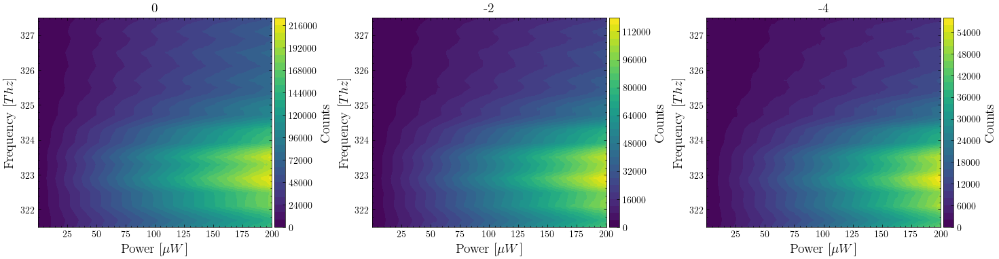

DATA FOR RESISTANCE: 97,500


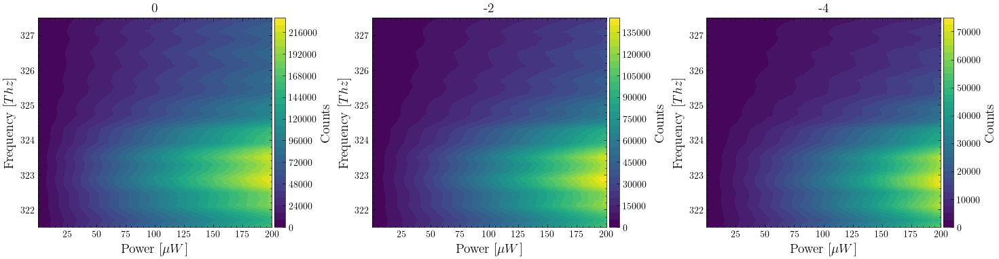

DATA FOR RESISTANCE: 325,300


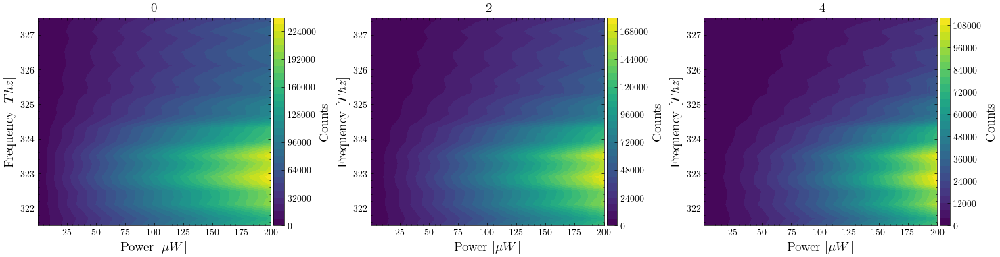

DATA FOR RESISTANCE: 552,000


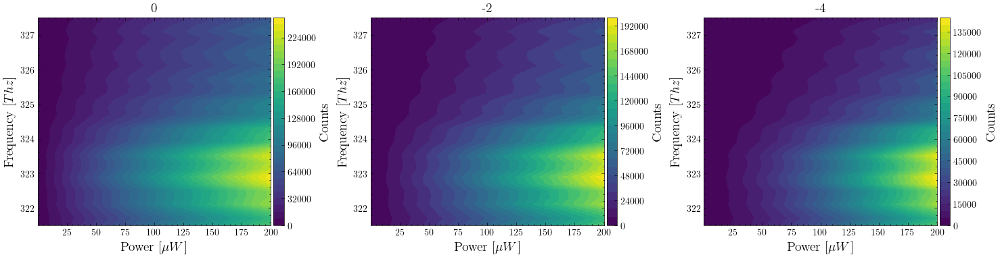

DATA FOR RESISTANCE: 677,000


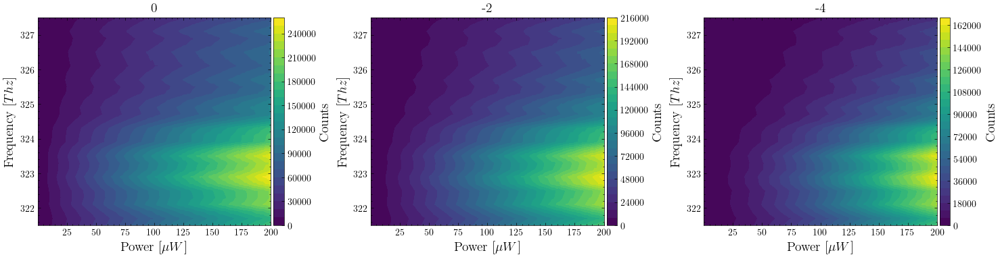

DATA FOR RESISTANCE: 807,000


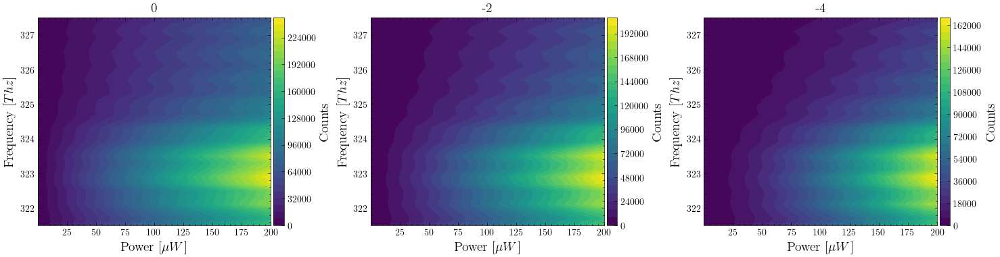

DATA FOR RESISTANCE: 1,000,000


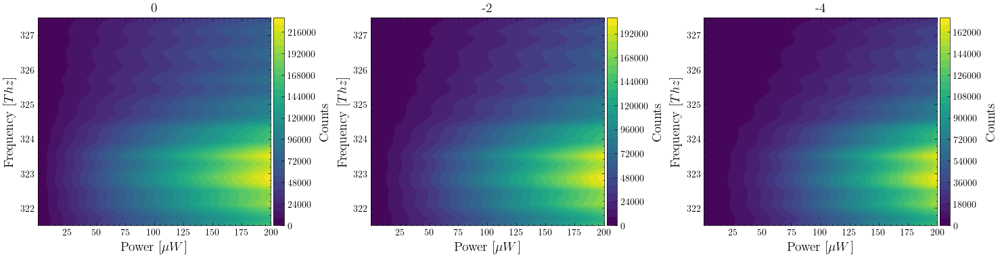

DATA FOR RESISTANCE: 3,012,000


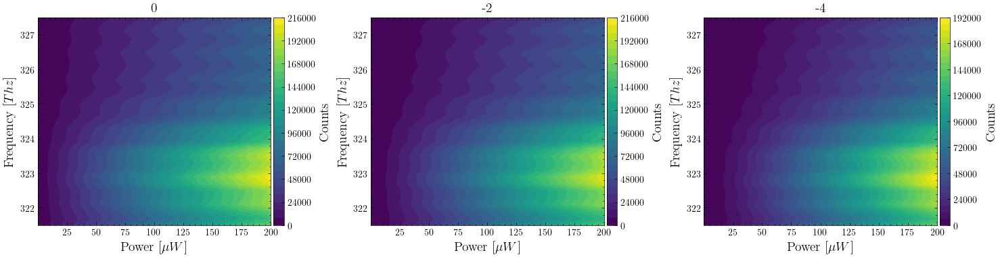

DATA FOR RESISTANCE: 10,000,000


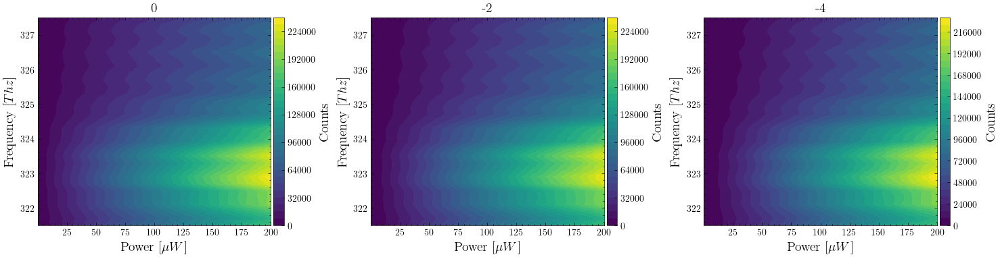

In [8]:
plot_2d_maps(data_dict, powerlist, freqlist, voltages, resistances)

DATA FOR RESISTANCE: 0


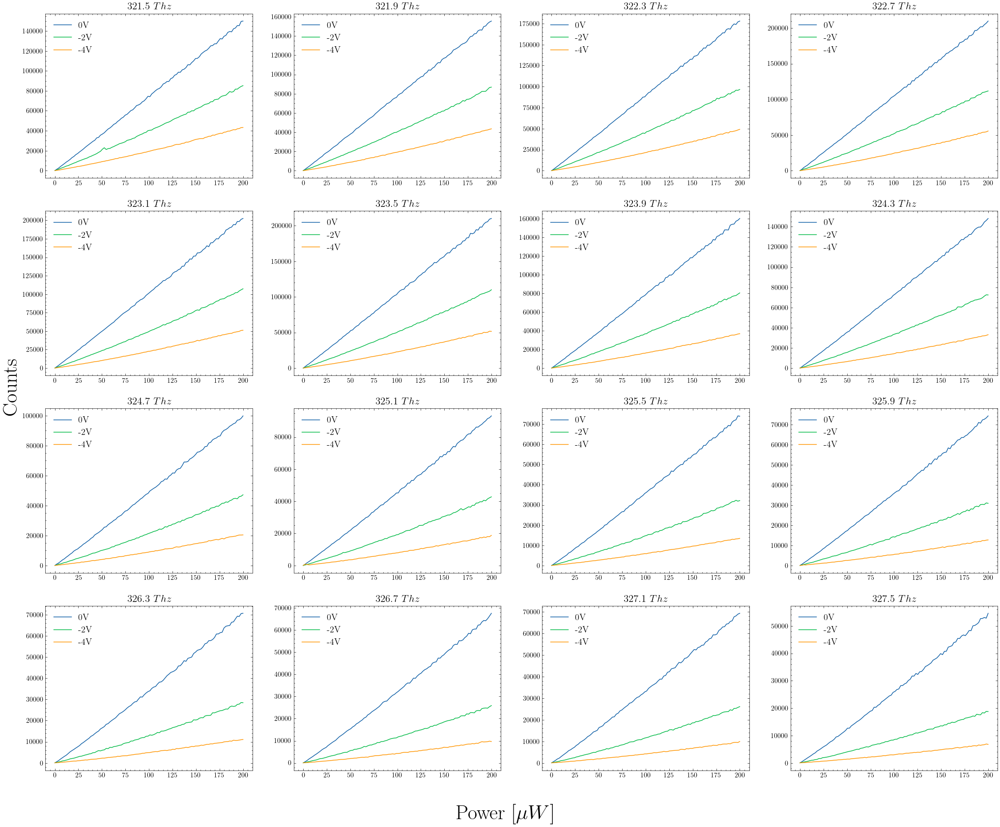

DATA FOR RESISTANCE: 97,500


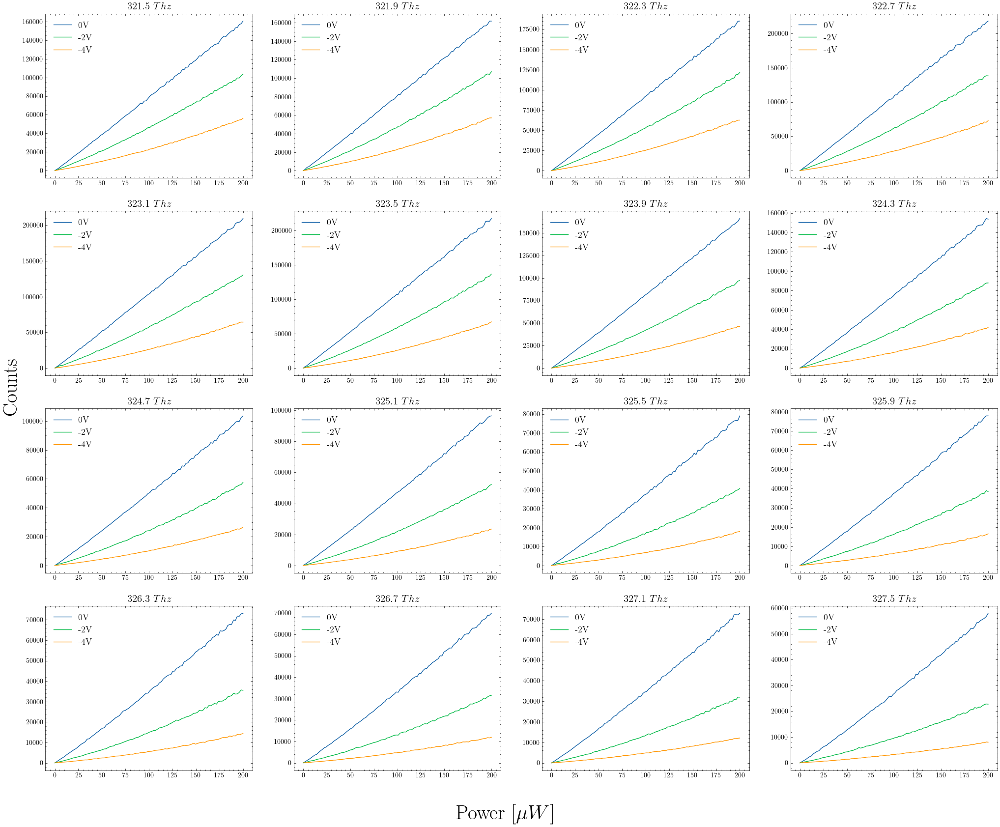

DATA FOR RESISTANCE: 325,300


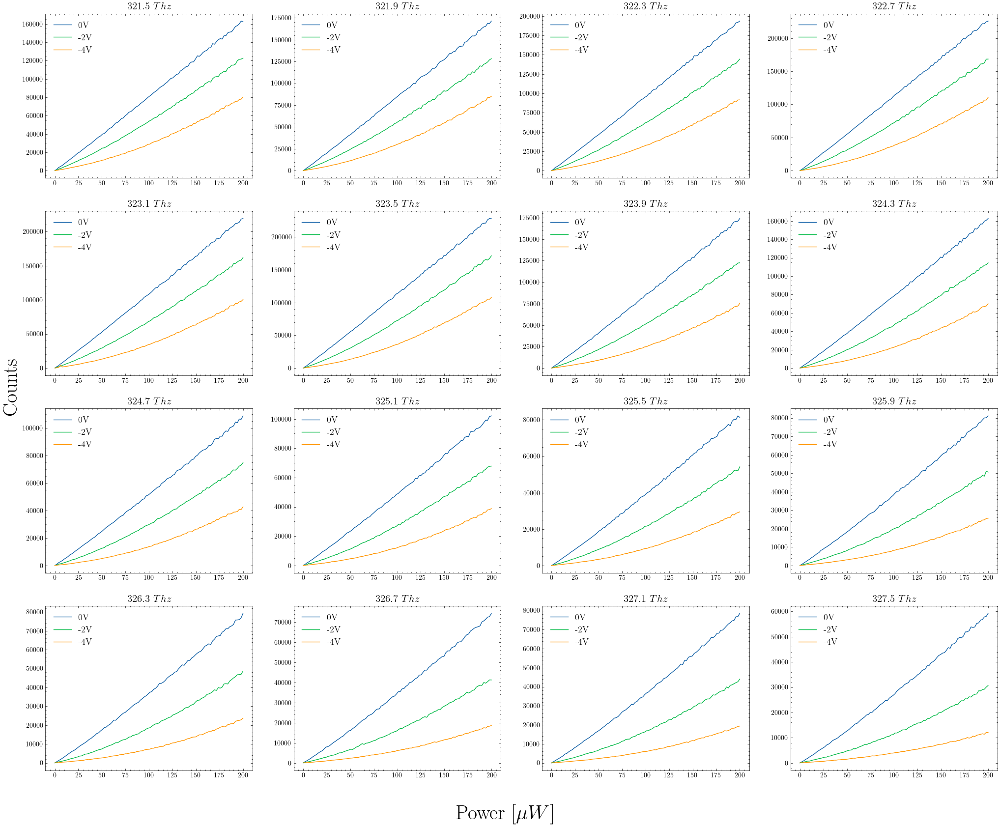

DATA FOR RESISTANCE: 552,000


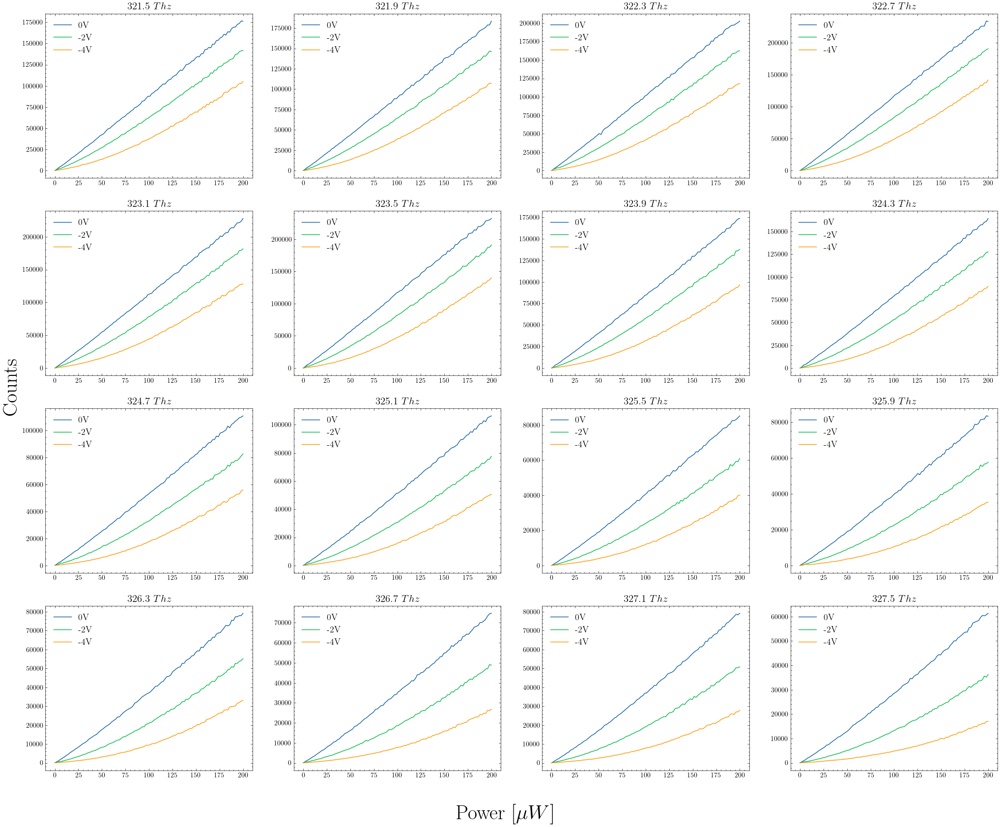

DATA FOR RESISTANCE: 677,000


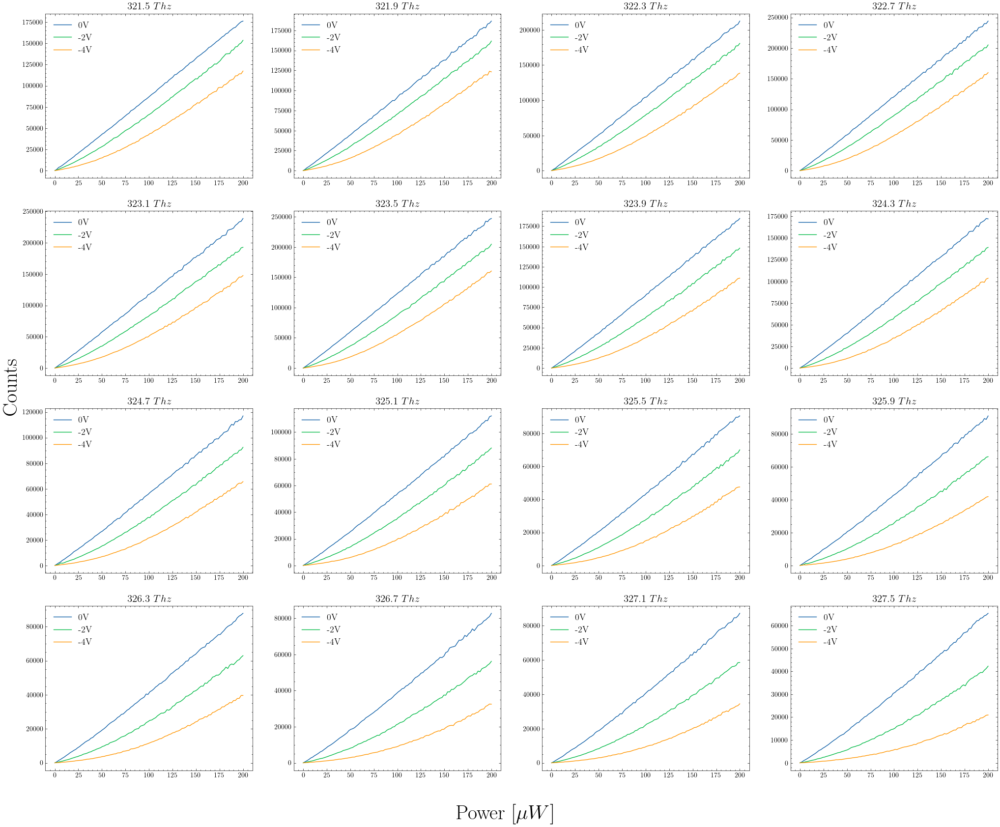

DATA FOR RESISTANCE: 807,000


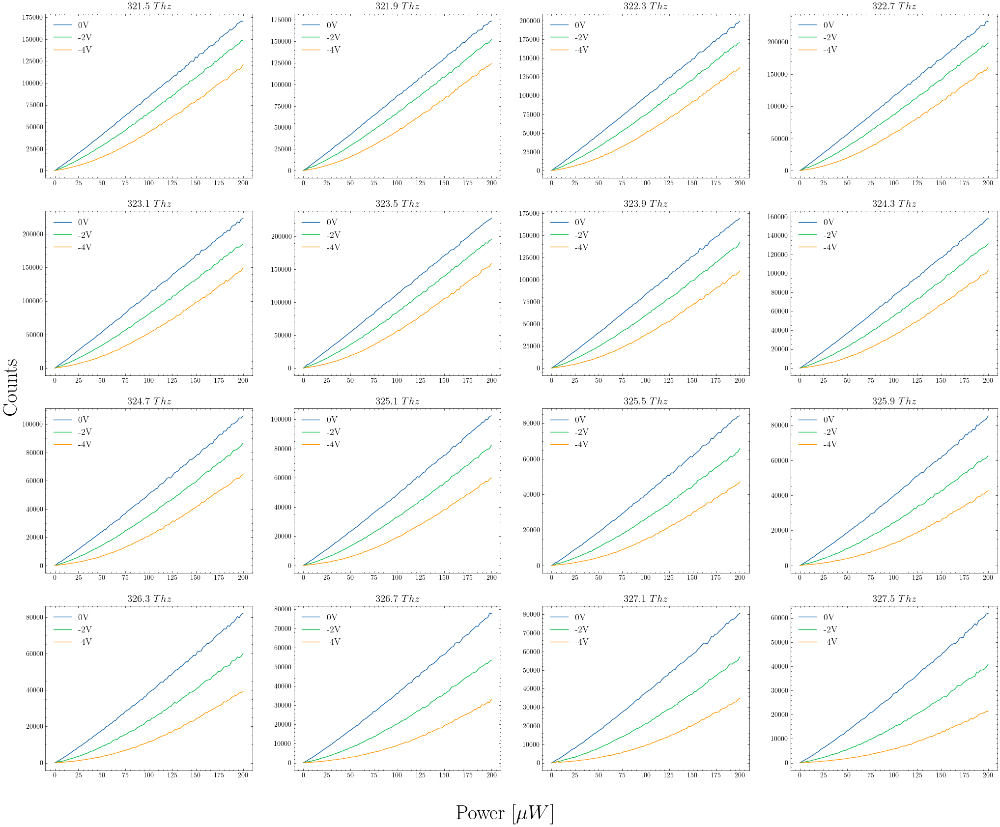

DATA FOR RESISTANCE: 1,000,000


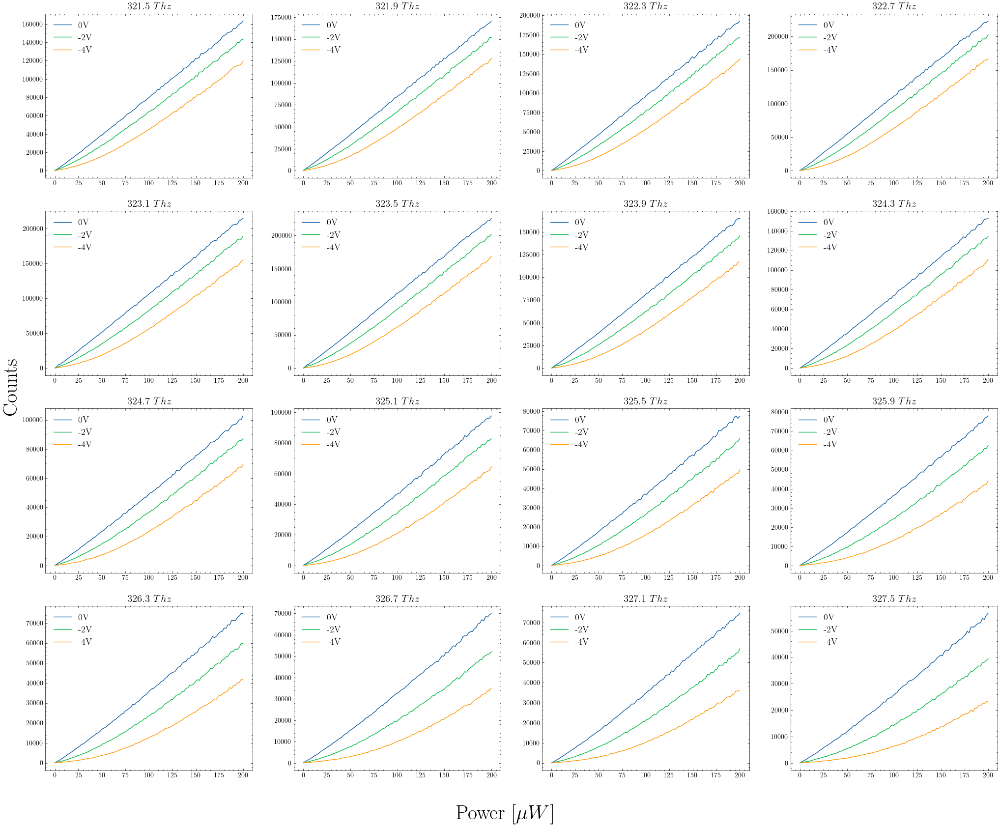

DATA FOR RESISTANCE: 3,012,000


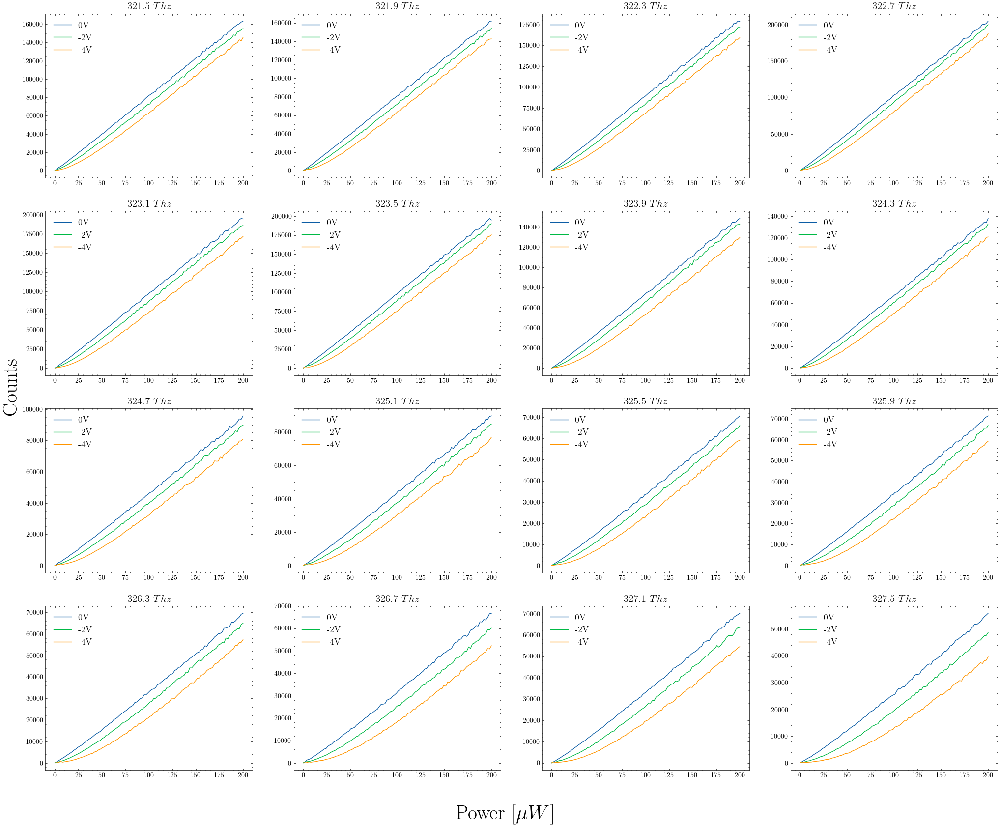

DATA FOR RESISTANCE: 10,000,000


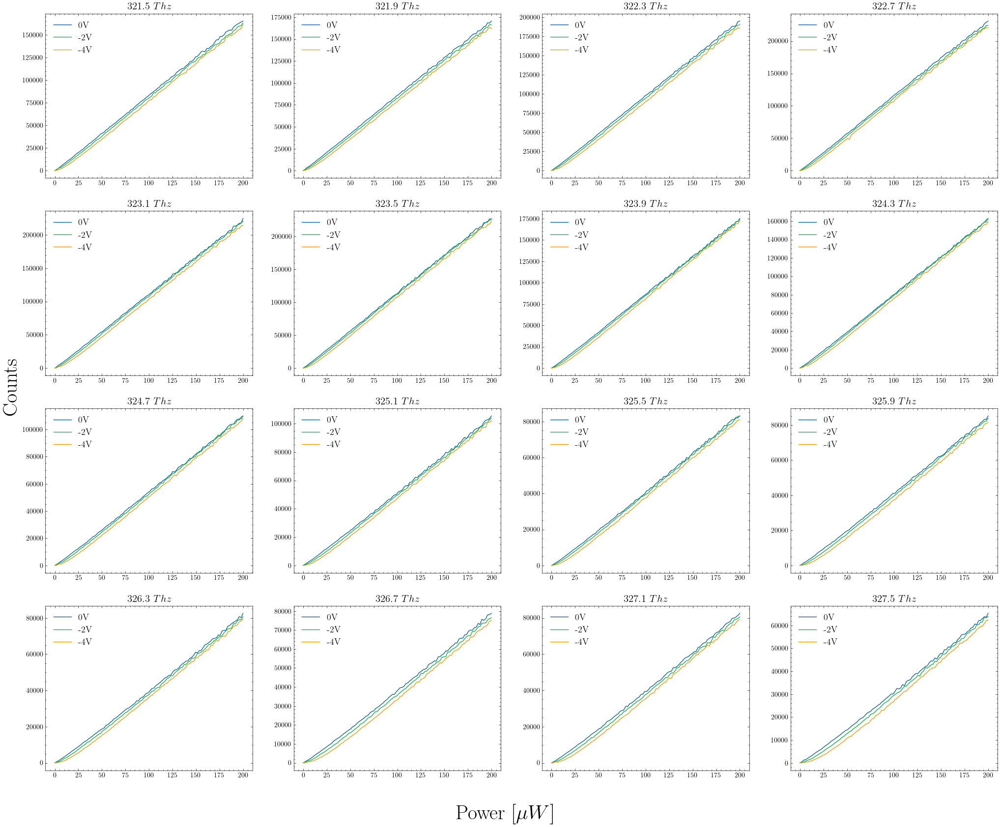

In [9]:
plot_power_counts(data_dict, powerlist, freqlist, voltages, resistances)

DATA FOR RESISTANCE: 0


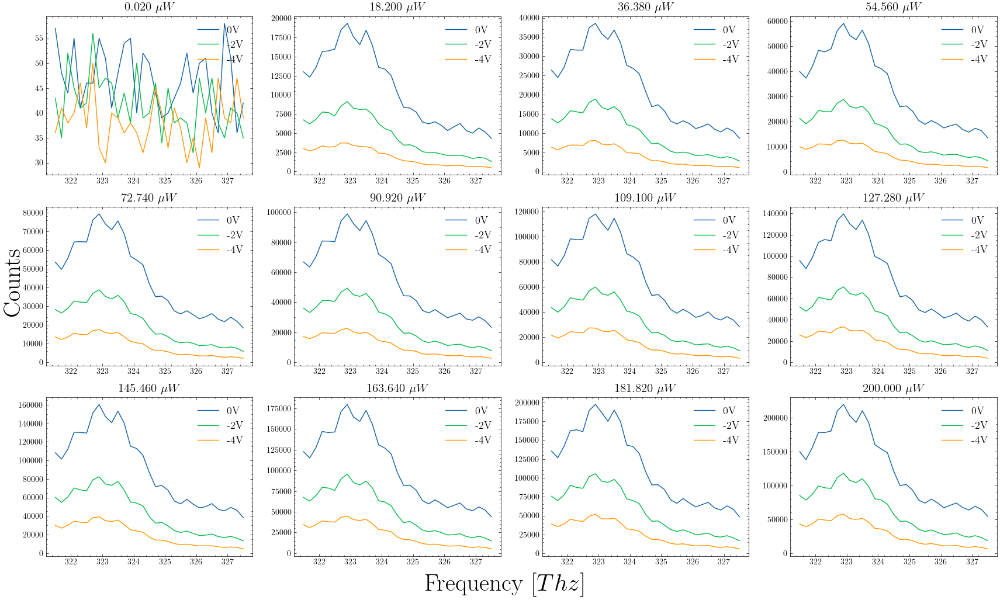

DATA FOR RESISTANCE: 97,500


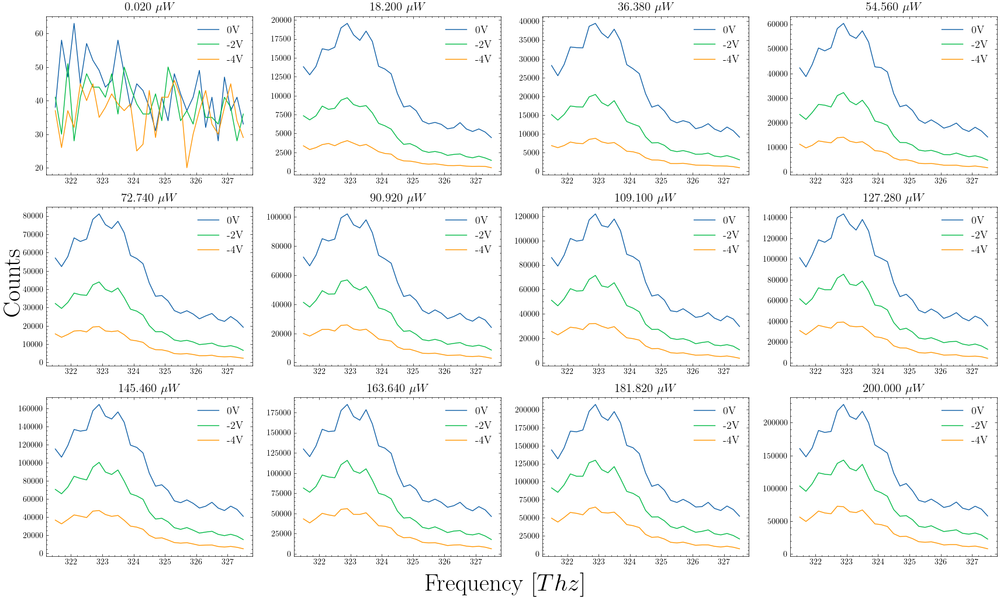

DATA FOR RESISTANCE: 325,300


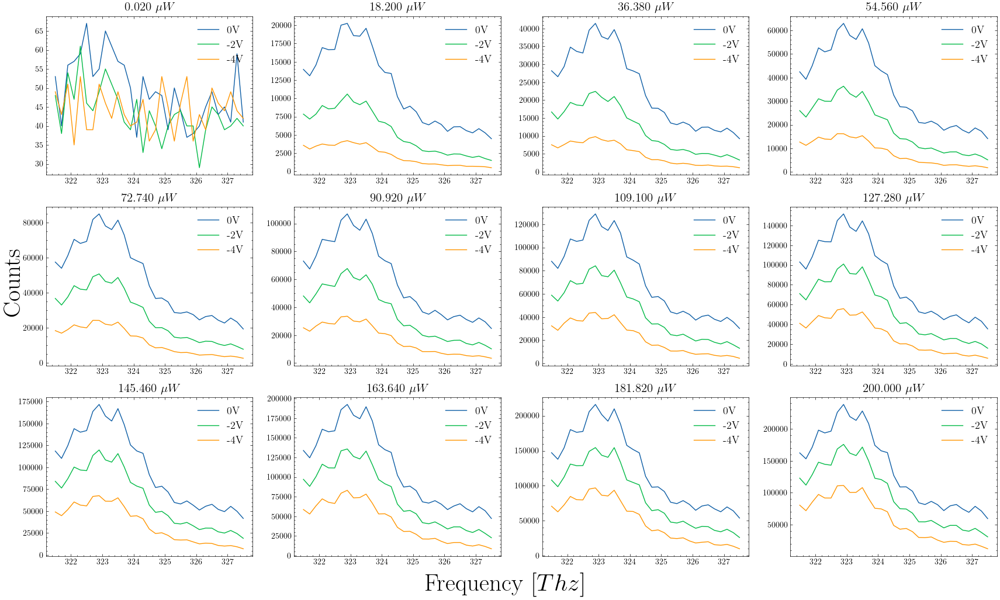

DATA FOR RESISTANCE: 552,000


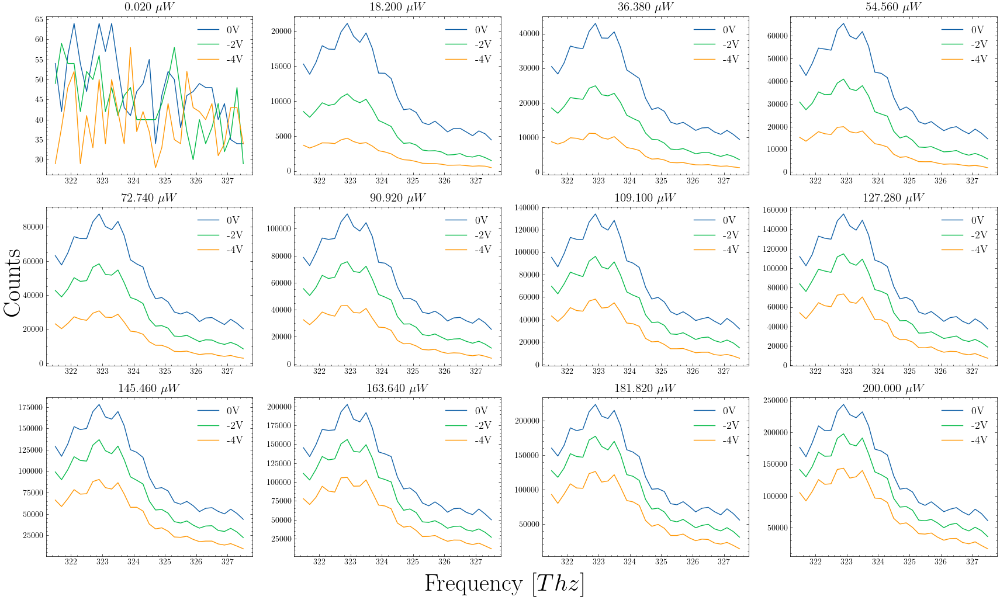

DATA FOR RESISTANCE: 677,000


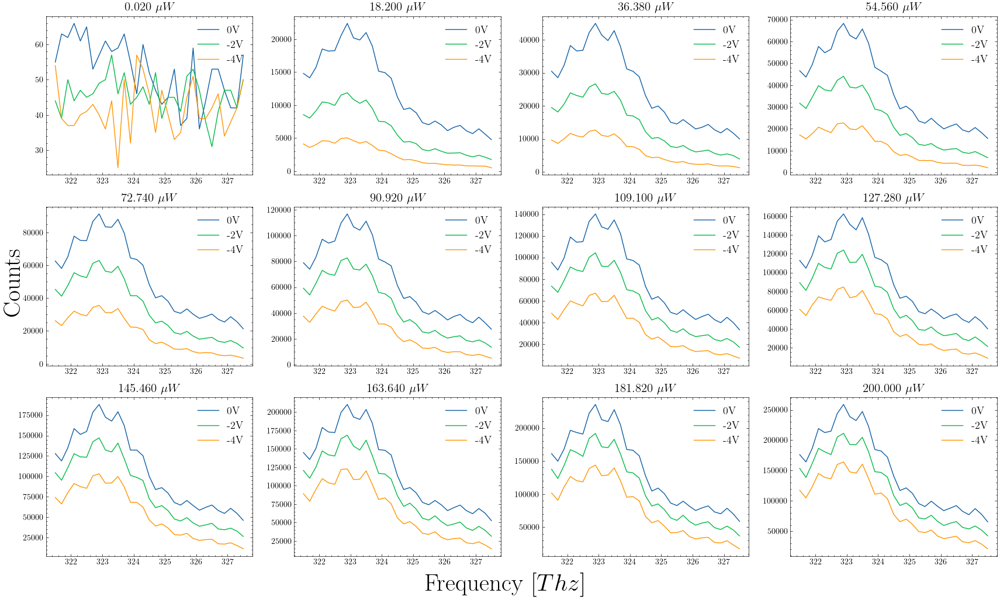

DATA FOR RESISTANCE: 807,000


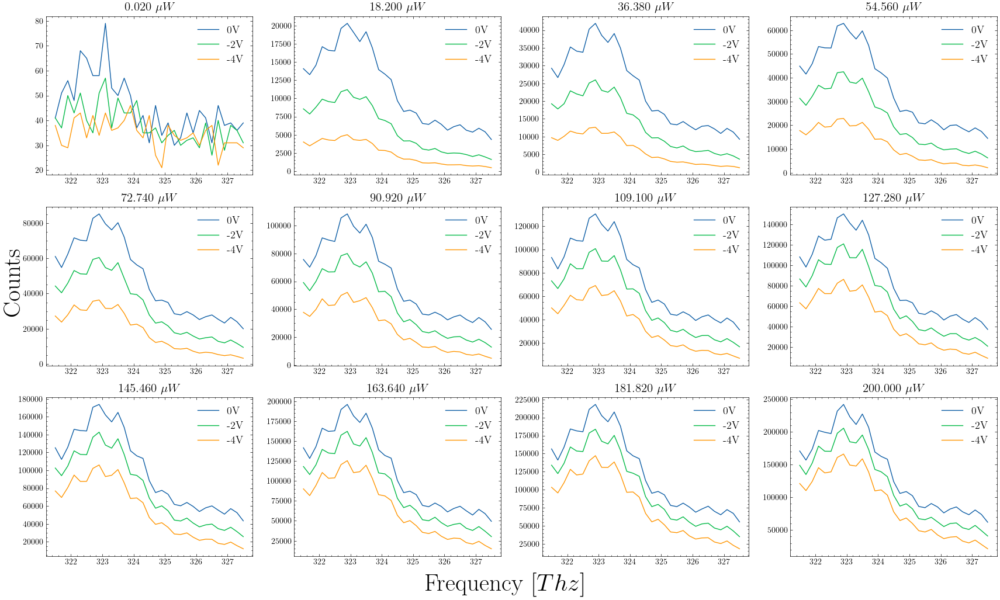

DATA FOR RESISTANCE: 1,000,000


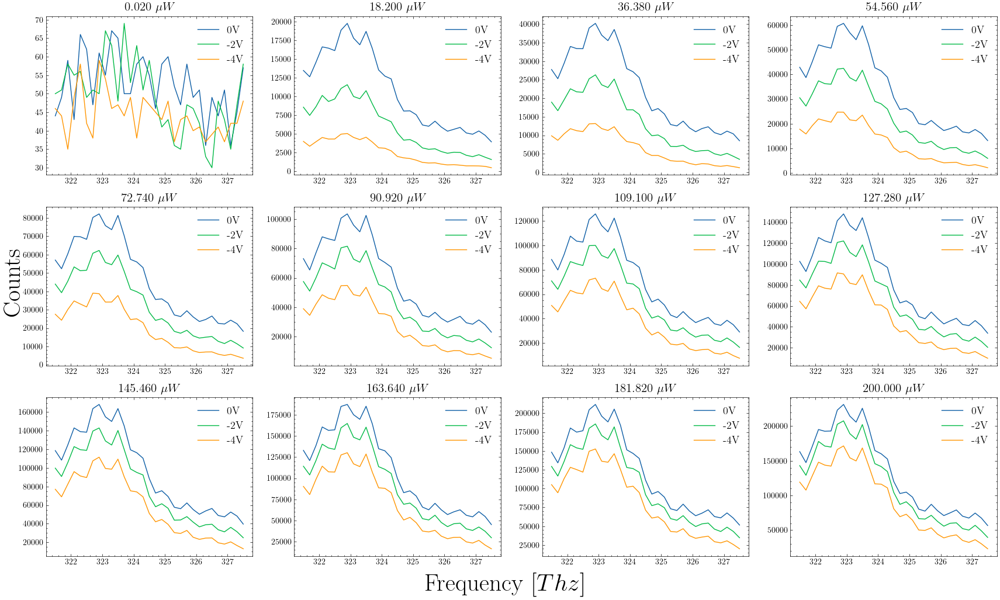

DATA FOR RESISTANCE: 3,012,000


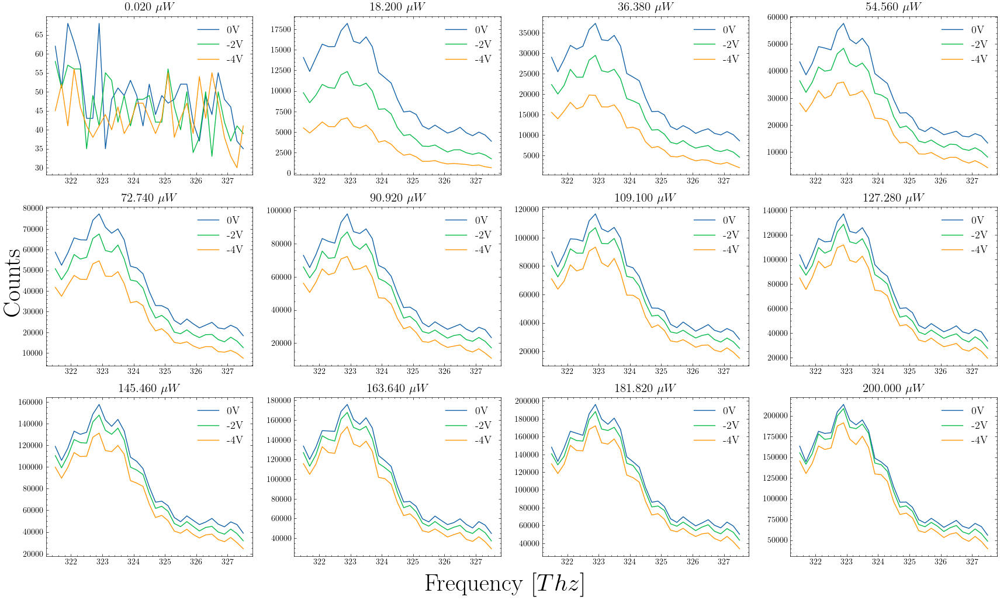

DATA FOR RESISTANCE: 10,000,000


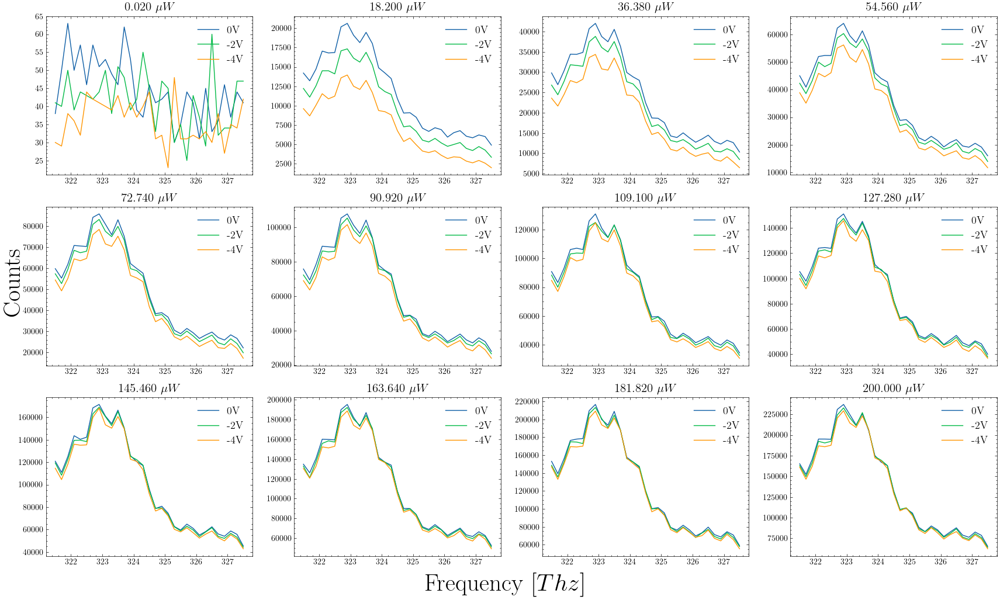

In [9]:
plot_frequency_counts(data_dict, powerlist, freqlist, voltages, resistances)

In [10]:
data_dict[0][-4].keys()

dict_keys(['m_freq', 'counts', 'current'])

In [69]:
def calculate_nl_coeff(fit_input: FitInput, fit_result: FitResult) -> np.ndarray:
    linspace = np.linspace(np.min(powerlist), np.max(powerlist), 1000)
    y_fit = fit_input.fit_func(linspace, *fit_result.parameters)
    deriv = np.gradient(y_fit, linspace, edge_order=2)
    deriv2 = np.gradient(deriv, linspace, edge_order=2)

    max_idx = np.argmax(deriv2)

    if max_idx == 0:
        nl_coeff = 0
    else:
        nl_coeff = deriv2[max_idx]

    nl_pow = linspace[max_idx]
    return nl_coeff, nl_pow

def pf_power_counts_fit(data_dict: dict, resistance: int, voltages: np.ndarray, powers: np.ndarray) -> FitResult:
    fit_inputs = []
    fit_results = []
    nl_coeffs = []
    nl_pows = []

    L = 3.5e-3  # Waveguide length in cm
    T = 298 # Temperature in Kelvin
    for voltage in voltages:
        fit_inputs_voltages = []
        fit_results_voltages = []
        nl_coeffs_voltages = []
        nl_pows_voltages = []

        counts = data_dict[resistance][voltage]["counts"]
        # counts_scaled = counts / np.max(counts, axis=0).reshape(1, -1)
        # error_scaled = np.sqrt(counts) / np.max(counts, axis=0).reshape(1, -1)
        frequencies = data_dict[resistance][voltage]["m_freq"]
        wls = 2.99792458e5 / frequencies  # Frequency in Thz to wavelength in nm
        for idx, wl in enumerate(wls[::2]):
            fk_fit = FKFit(powers, resistance * 1e-6, L, wl, 0.3, T, voltage)
            fit_func = fk_fit.FK_fit_power_scaled
            fit_input = FitInput(
                powers,
                counts[idx] / np.max(counts[idx]),
                np.sqrt(counts[idx]) / np.max(counts[idx]),
                fit_func,
                [0.02, 0],
            )
            # bounds = {"eta": (0, 1), "alpha_0": (0, None)}
            # fit_result = perform_fit(fit_input, bounds=bounds)
            fit_result = perform_fit(fit_input)
            nl_coeff, nl_pow = calculate_nl_coeff(fit_input, fit_result)

            fit_inputs_voltages.append(fit_input)
            fit_results_voltages.append(fit_result)
            nl_coeffs_voltages.append(nl_coeff)
            nl_pows_voltages.append(nl_pow)


            if not fit_result.success:
                print(
                    f"Fit with resistance {resistance}, voltage {voltage} and wavelength {wl} was not completely successful."
                )
        fit_inputs.append(fit_inputs_voltages)
        fit_results.append(fit_results_voltages)
        nl_coeffs.append(nl_coeffs_voltages)
        nl_pows.append(nl_pows_voltages)
    return np.array(fit_inputs), np.array(fit_results), np.array(nl_coeffs), np.array(nl_pows)

In [70]:
a, b, c, d = pf_power_counts_fit(data_dict, 807000, voltages, powerlist)

/home/ali/Code/Master's project/data_analysis/utilities.py:107: RuntimeWarning: invalid value encountered in power
  beta1 = 1.1e5 * (Eg - Eph) * (2 * mu1) ** (1 / 3) * F ** (-2 / 3)
/home/ali/Code/Master's project/data_analysis/utilities.py:108: RuntimeWarning: invalid value encountered in power
  beta2 = 1.1e5 * (Eg - Eph) * (2 * mu2) ** (1 / 3) * F ** (-2 / 3)
/home/ali/Code/Master's project/data_analysis/utilities.py:121: RuntimeWarning: invalid value encountered in power
  FKa = (a1 + a2) * F ** (1 / 3) * 1e4 / n
/home/ali/Code/Master's project/data_analysis/utilities.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
 improvement from the last ten iterations.
  alpha = fsolve(func, self.alphas[-1])[0]
/home/ali/Code/Master's project/data_analysis/utilities.py:129: RuntimeWarning: invalid value encountered in sqrt
  depletion_width = 1e-7 * np.sqrt(1e4 + 795.5 * (1.4 - V_d))


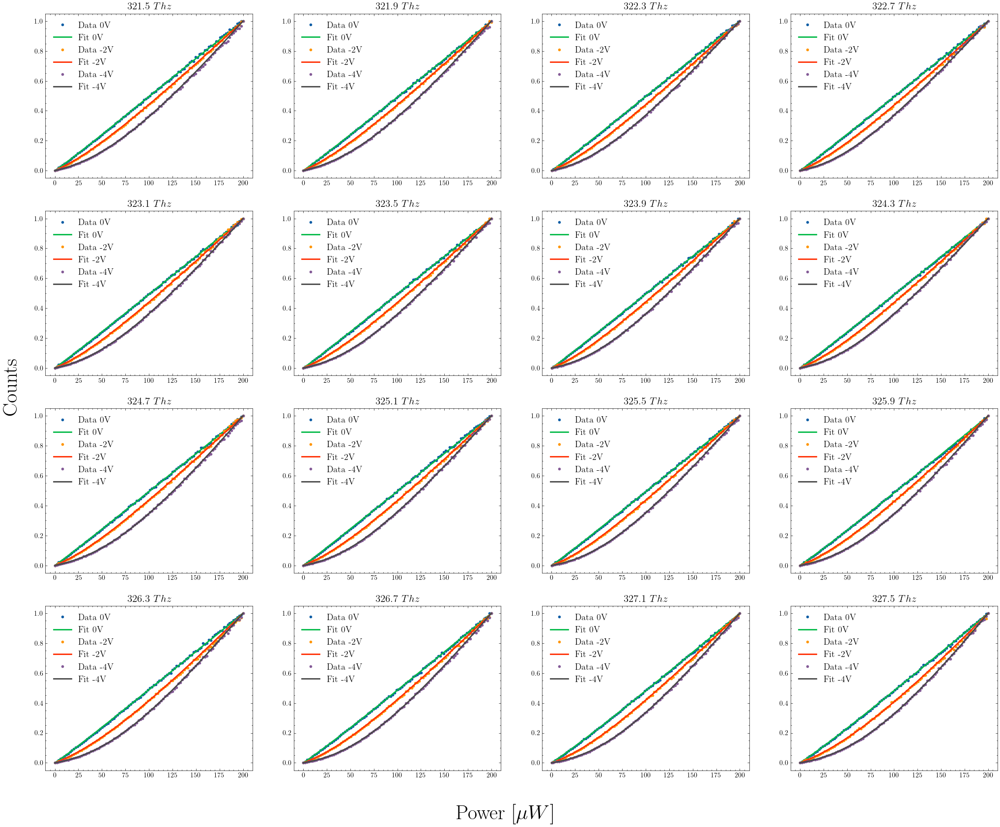

In [73]:
plot_power_counts_with_fit(a, b, voltages)

PLOTS FOR RESISTANCE 0
Fit with resistance 0, voltage 0 and wavelength 932.4803057954177 was not completely successful.
Fit with resistance 0, voltage 0 and wavelength 931.3216763080565 was not completely successful.
Fit with resistance 0, voltage 0 and wavelength 930.1658856625633 was not completely successful.
Fit with resistance 0, voltage 0 and wavelength 929.0128556627604 was not completely successful.
Fit with resistance 0, voltage 0 and wavelength 927.8626864144026 was not completely successful.


/home/ali/Code/Master's project/data_analysis/utilities.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
 improvement from the last ten iterations.
  alpha = fsolve(func, self.alphas[-1])[0]


Fit with resistance 0, voltage 0 and wavelength 926.7155127837459 was not completely successful.
Fit with resistance 0, voltage 0 and wavelength 925.5709692381397 was not completely successful.
Fit with resistance 0, voltage 0 and wavelength 924.4294371087192 was not completely successful.
Fit with resistance 0, voltage 0 and wavelength 923.2905446683976 was not completely successful.
Fit with resistance 0, voltage 0 and wavelength 922.153966036935 was not completely successful.
Fit with resistance 0, voltage 0 and wavelength 921.0213975156654 was not completely successful.
Fit with resistance 0, voltage 0 and wavelength 919.8909202658238 was not completely successful.
Fit with resistance 0, voltage 0 and wavelength 918.7632545115841 was not completely successful.
Fit with resistance 0, voltage 0 and wavelength 917.6382958307652 was not completely successful.
Fit with resistance 0, voltage 0 and wavelength 916.5161782116108 was not completely successful.
Fit with resistance 0, voltage 

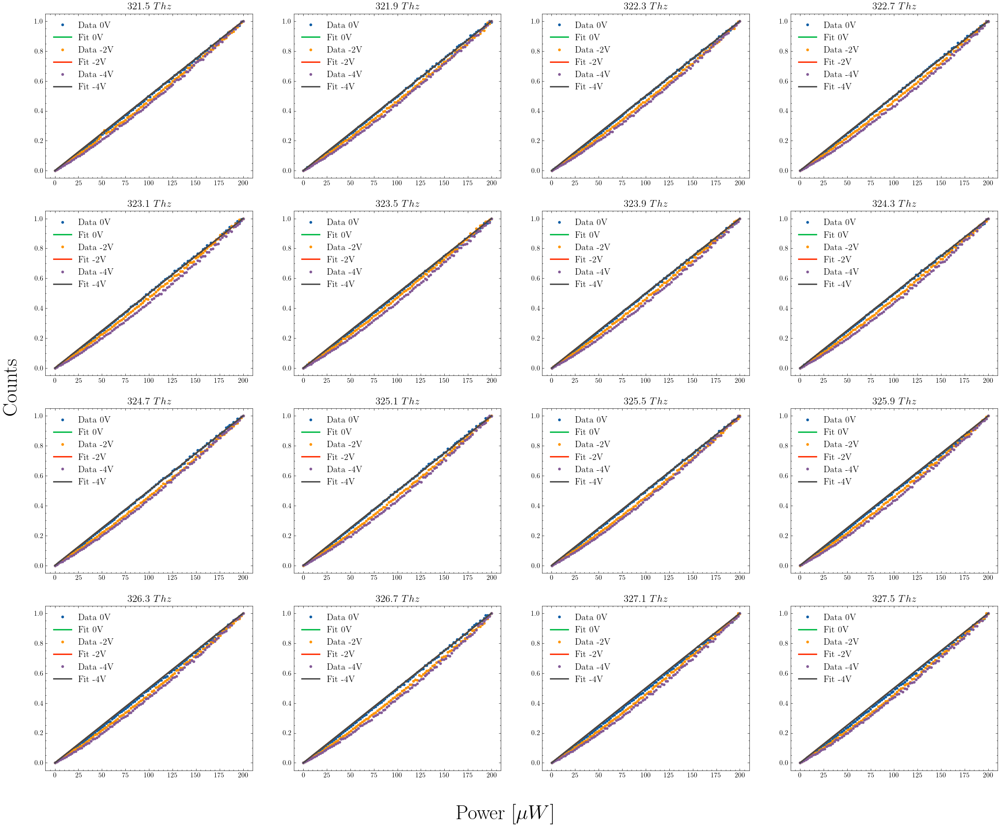

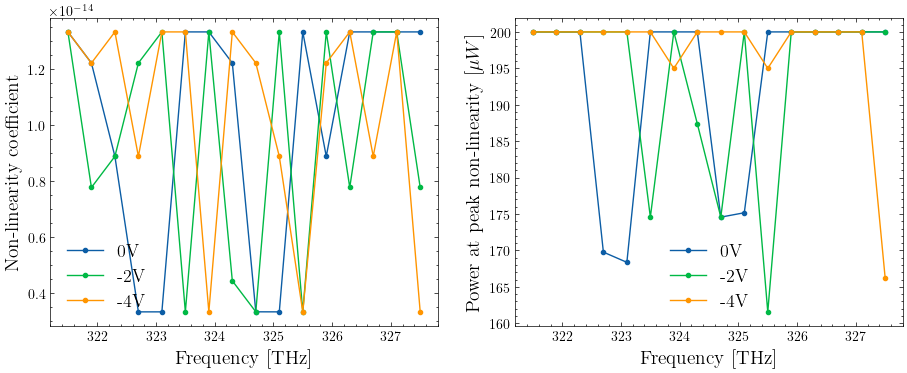

PLOTS FOR RESISTANCE 97,500


/home/ali/Code/Master's project/data_analysis/utilities.py:129: RuntimeWarning: invalid value encountered in sqrt
  depletion_width = 1e-7 * np.sqrt(1e4 + 795.5 * (1.4 - V_d))
/home/ali/Code/Master's project/data_analysis/utilities.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
 improvement from the last ten iterations.
  alpha = fsolve(func, self.alphas[-1])[0]
/home/ali/Code/Master's project/data_analysis/utilities.py:107: RuntimeWarning: invalid value encountered in power
  beta1 = 1.1e5 * (Eg - Eph) * (2 * mu1) ** (1 / 3) * F ** (-2 / 3)
/home/ali/Code/Master's project/data_analysis/utilities.py:108: RuntimeWarning: invalid value encountered in power
  beta2 = 1.1e5 * (Eg - Eph) * (2 * mu2) ** (1 / 3) * F ** (-2 / 3)
/home/ali/Code/Master's project/data_analysis/utilities.py:121: RuntimeWarning: invalid value encountered in power
  FKa = (a1 + a2) * F ** (1 / 3) * 1e4 / n
/home/ali/Code/Master's project/data_analysis/utilities.py:167: Runtime

Fit with resistance 97500, voltage -2 and wavelength 924.4293281452304 was not completely successful.


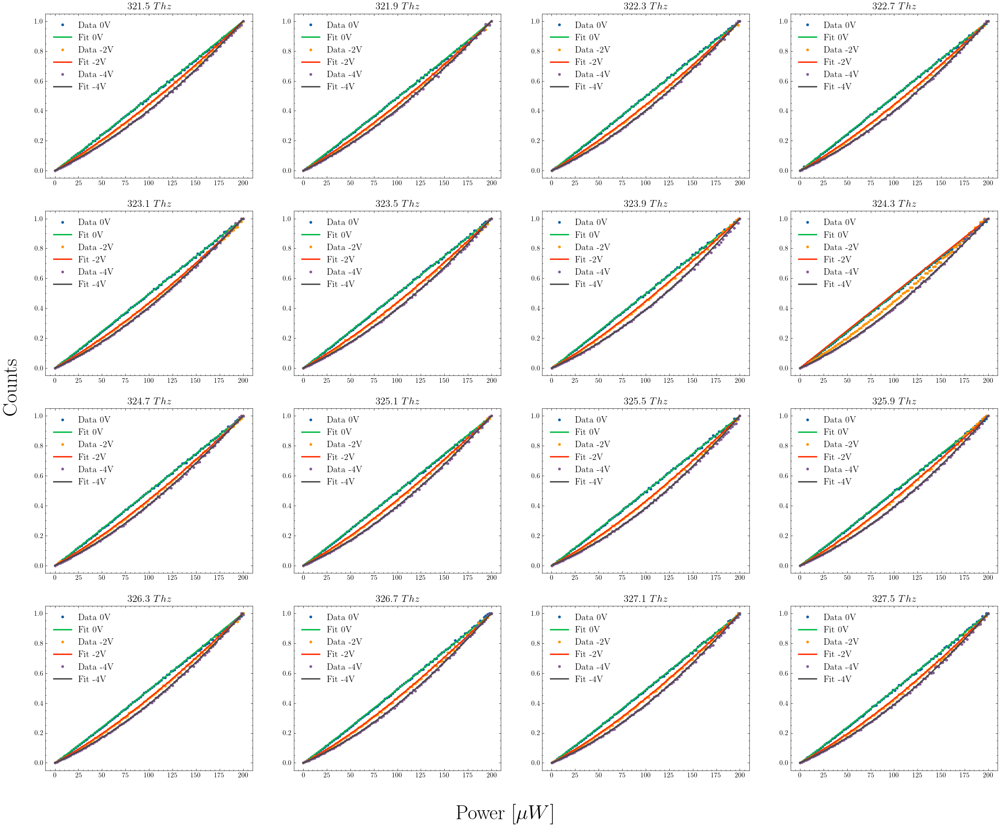

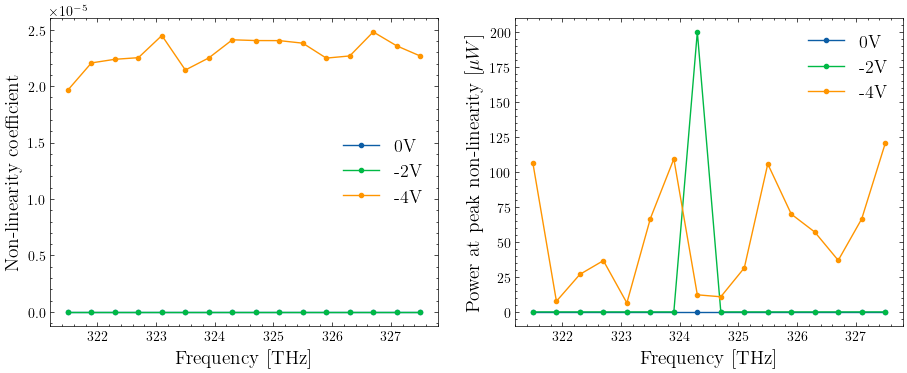

PLOTS FOR RESISTANCE 325,300


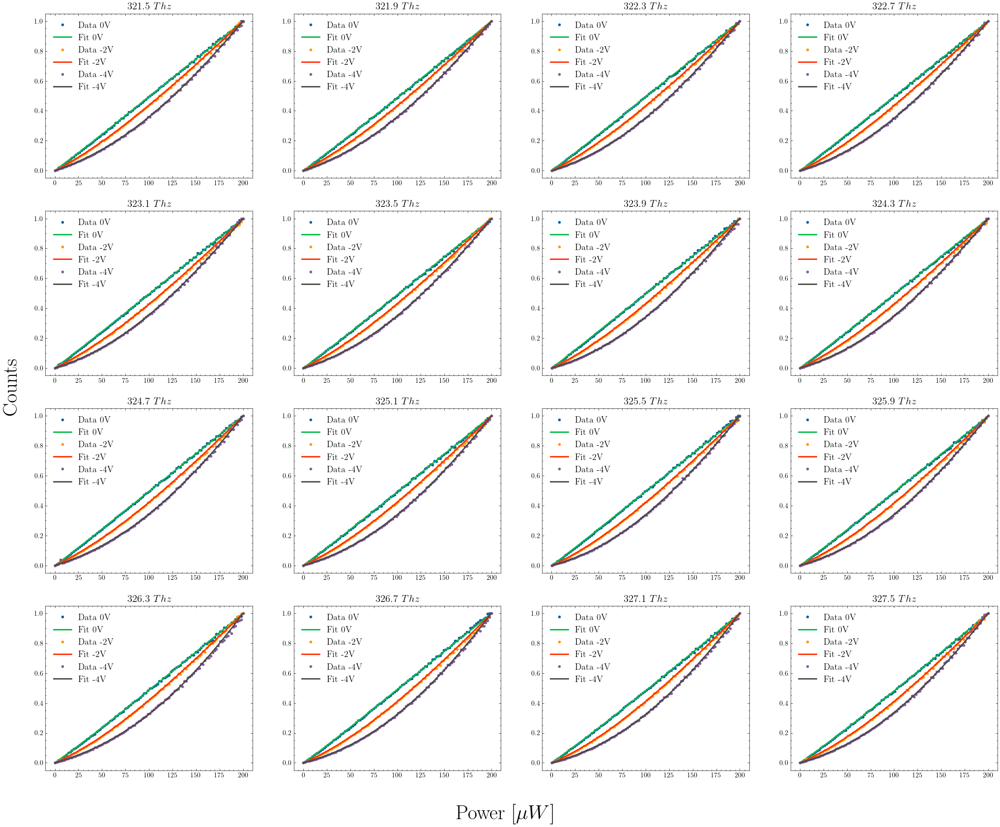

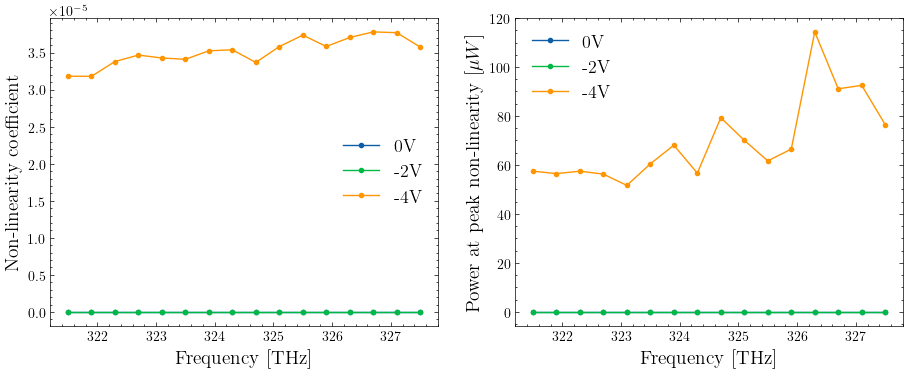

PLOTS FOR RESISTANCE 552,000


/home/ali/Code/Master's project/data_analysis/utilities.py:175: RuntimeWarning: The iteration is not making good progress, as measured by the 
 improvement from the last five Jacobian evaluations.
  alpha = fsolve(func, self.alphas[-1])[0]


Fit with resistance 552000, voltage 0 and wavelength 927.8628134091923 was not completely successful.
Fit with resistance 552000, voltage 0 and wavelength 924.4293957237956 was not completely successful.


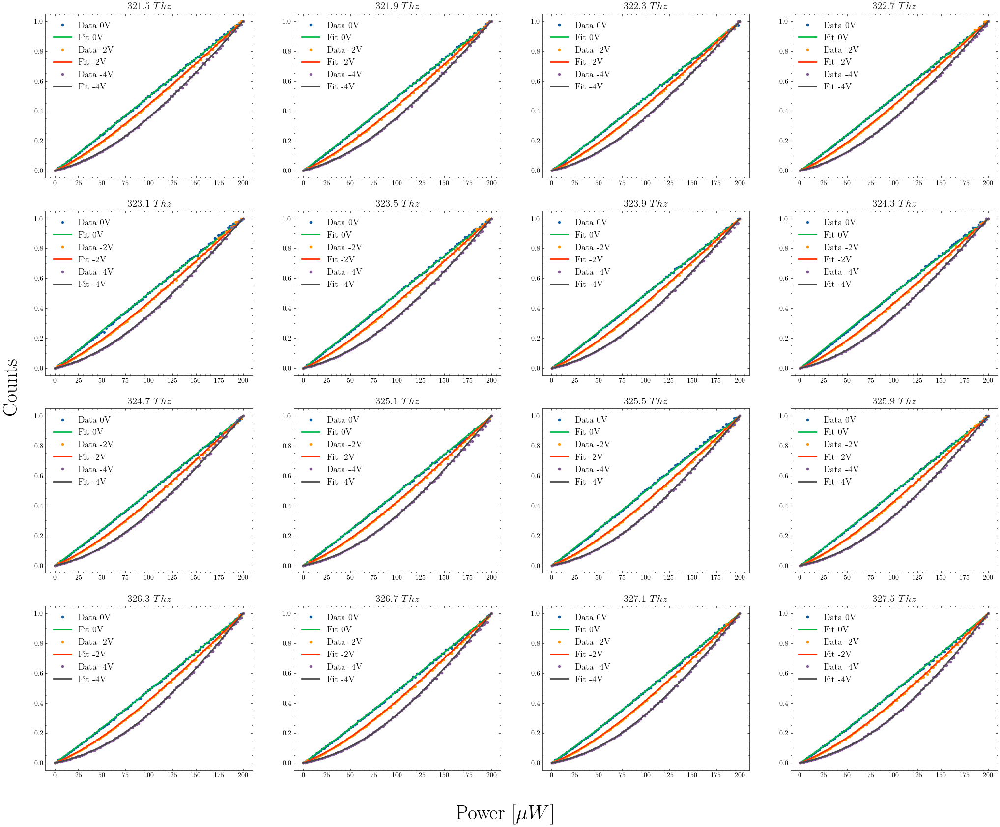

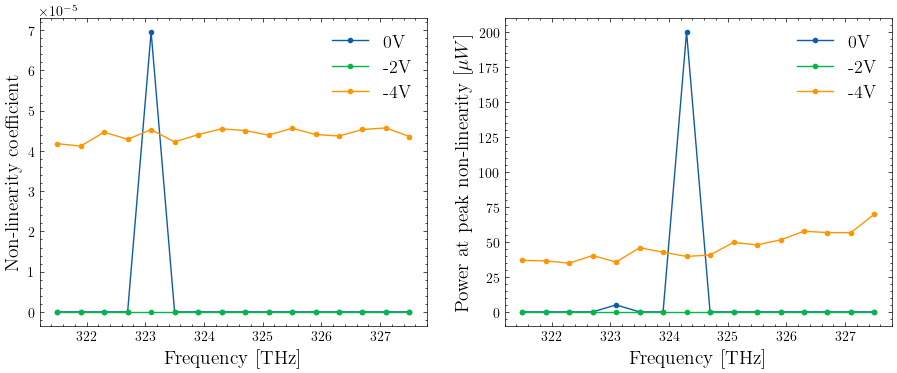

PLOTS FOR RESISTANCE 677,000


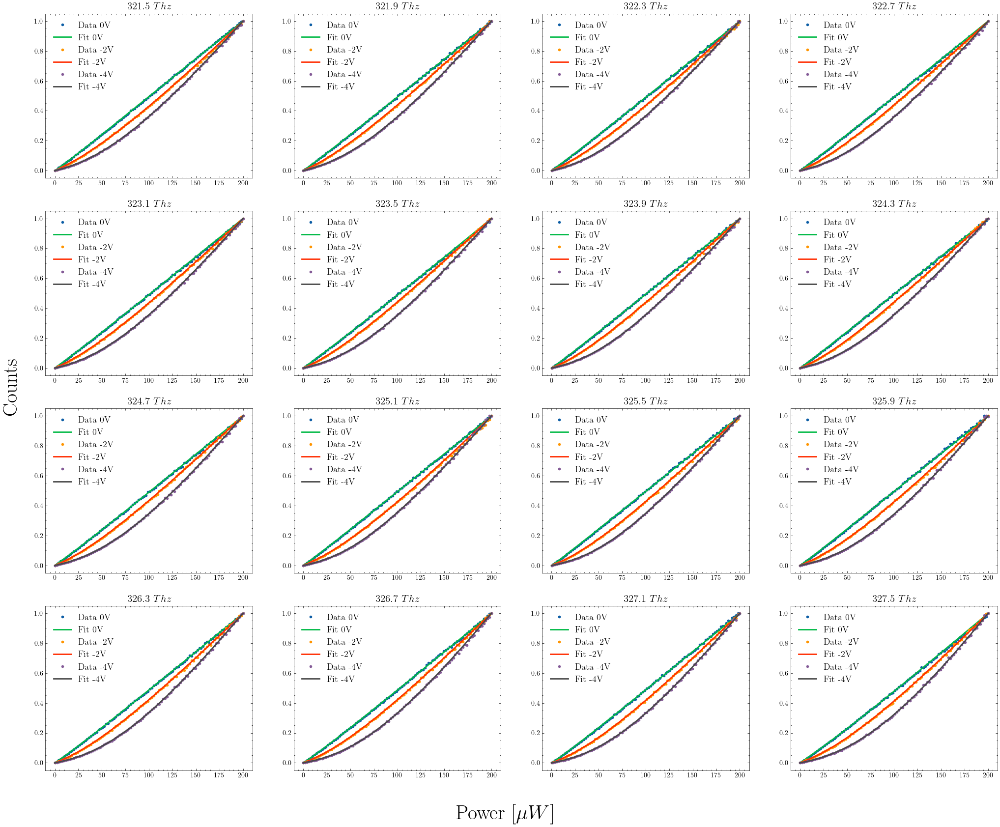

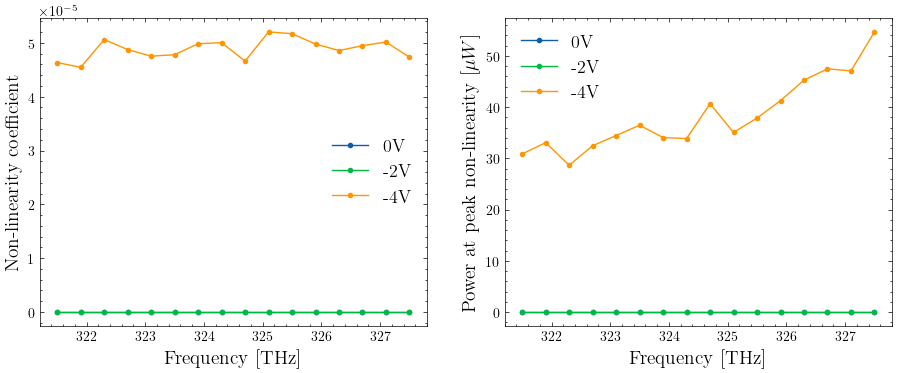

PLOTS FOR RESISTANCE 807,000


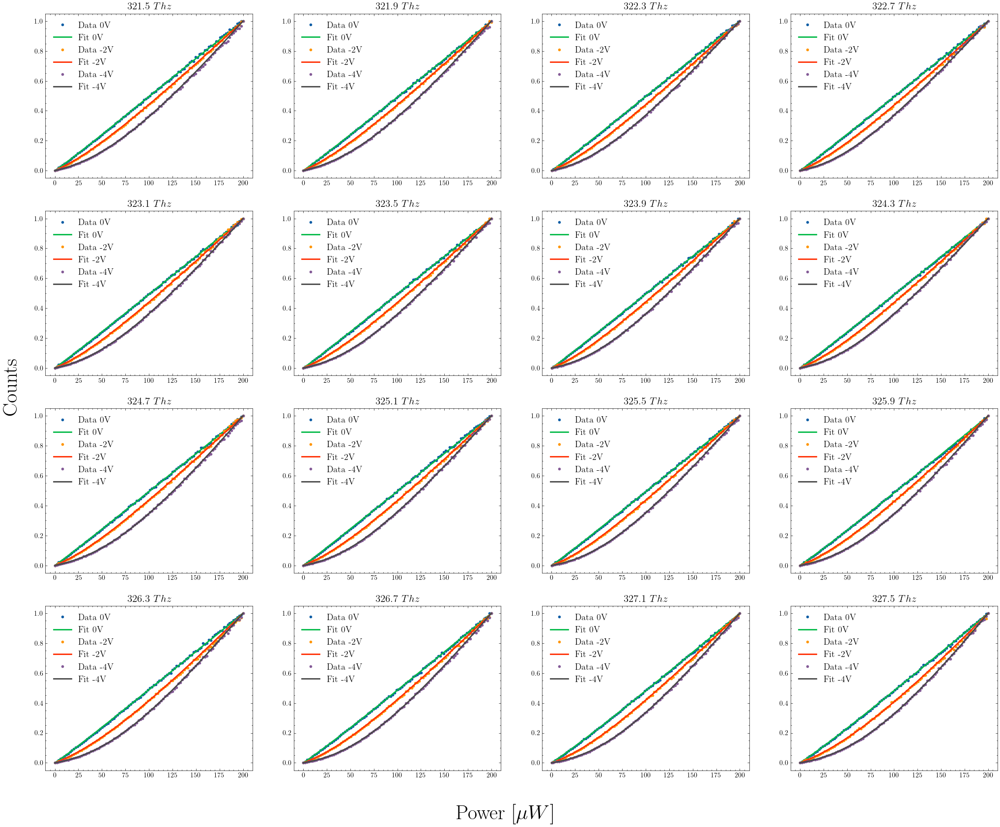

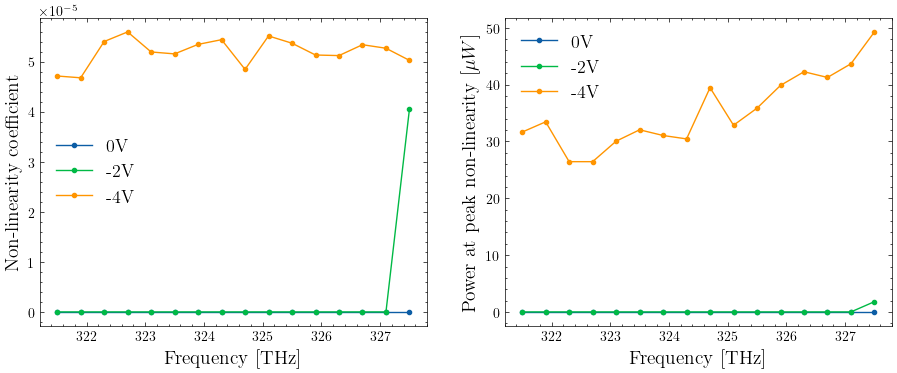

PLOTS FOR RESISTANCE 1,000,000


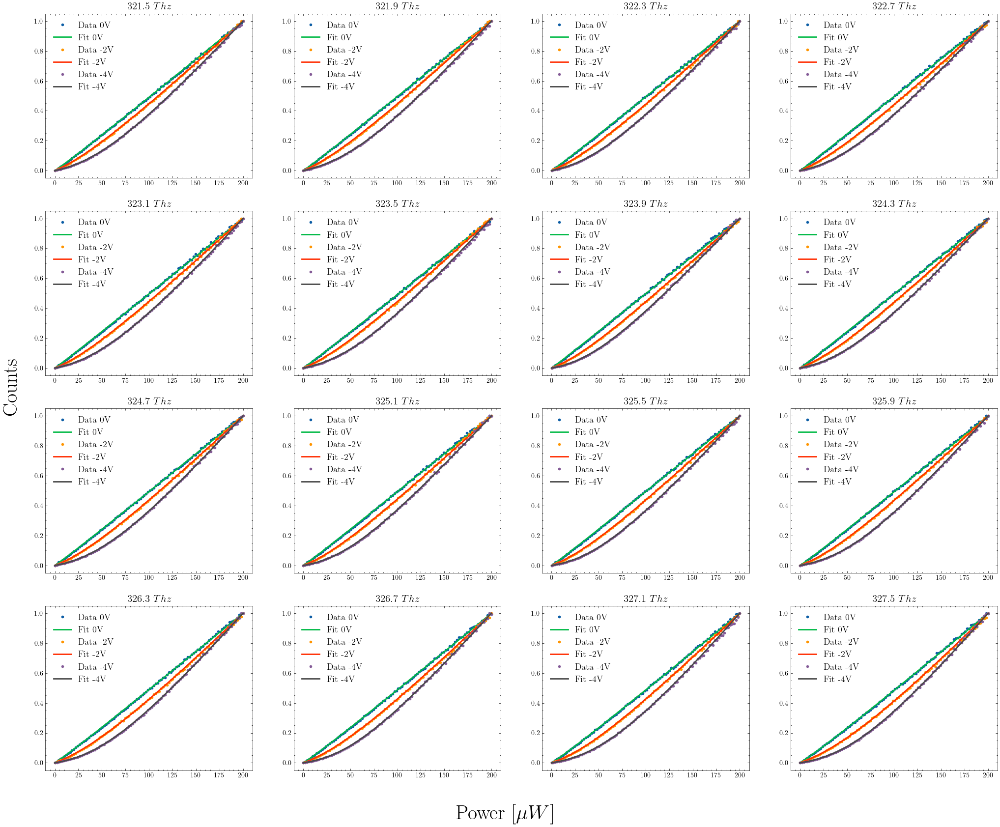

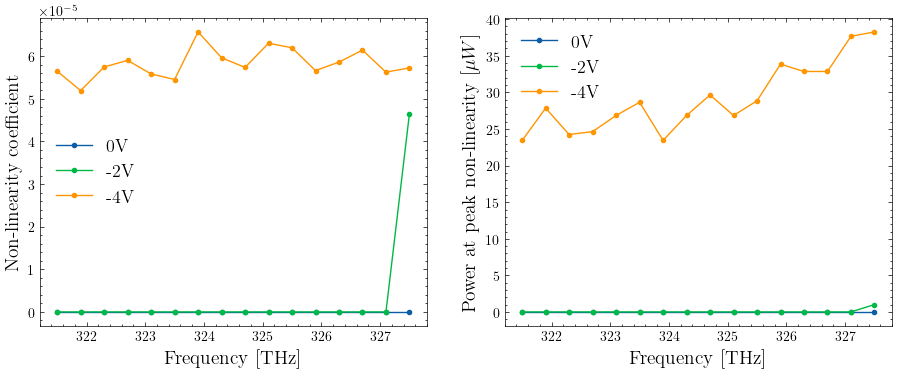

PLOTS FOR RESISTANCE 3,012,000


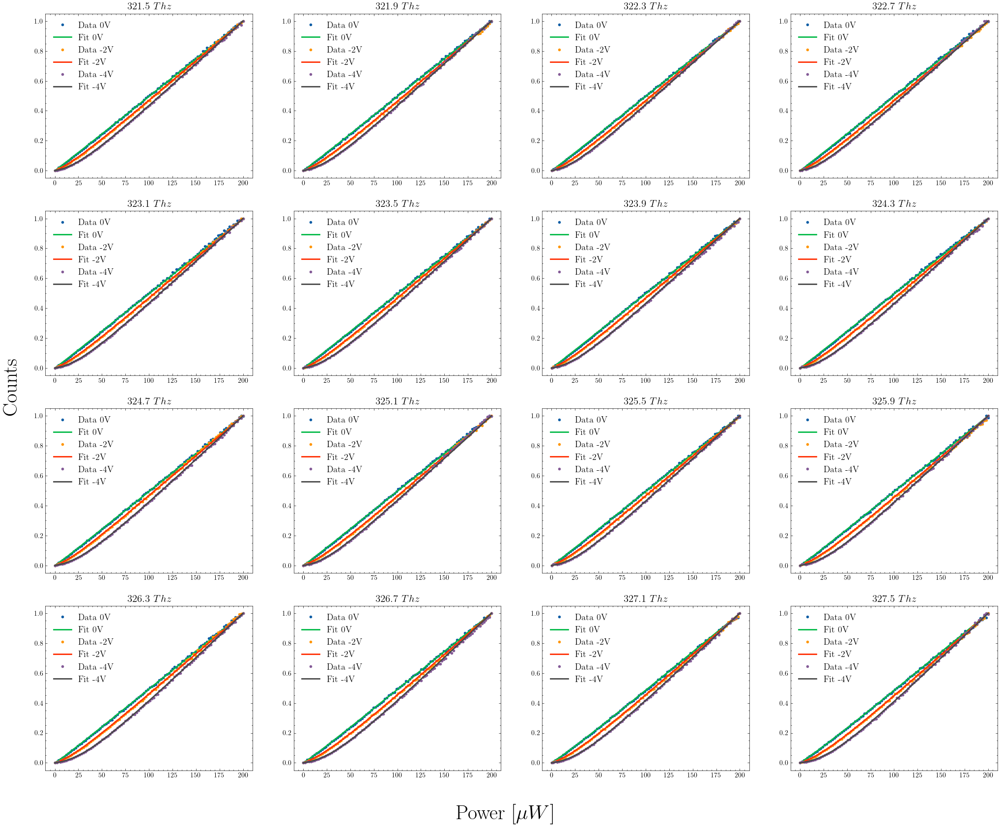

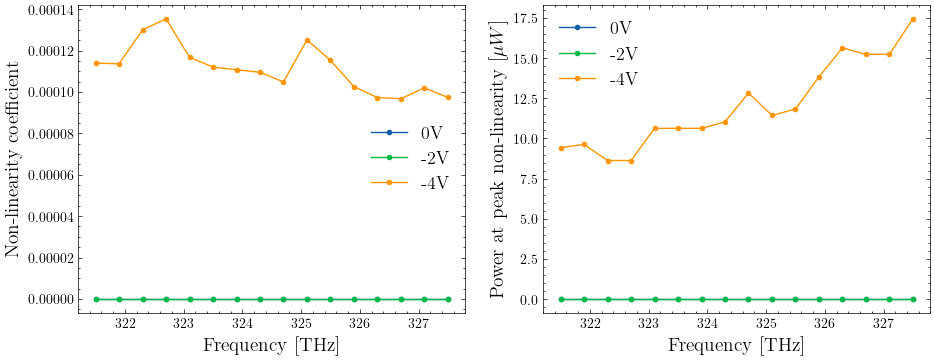

PLOTS FOR RESISTANCE 10,000,000


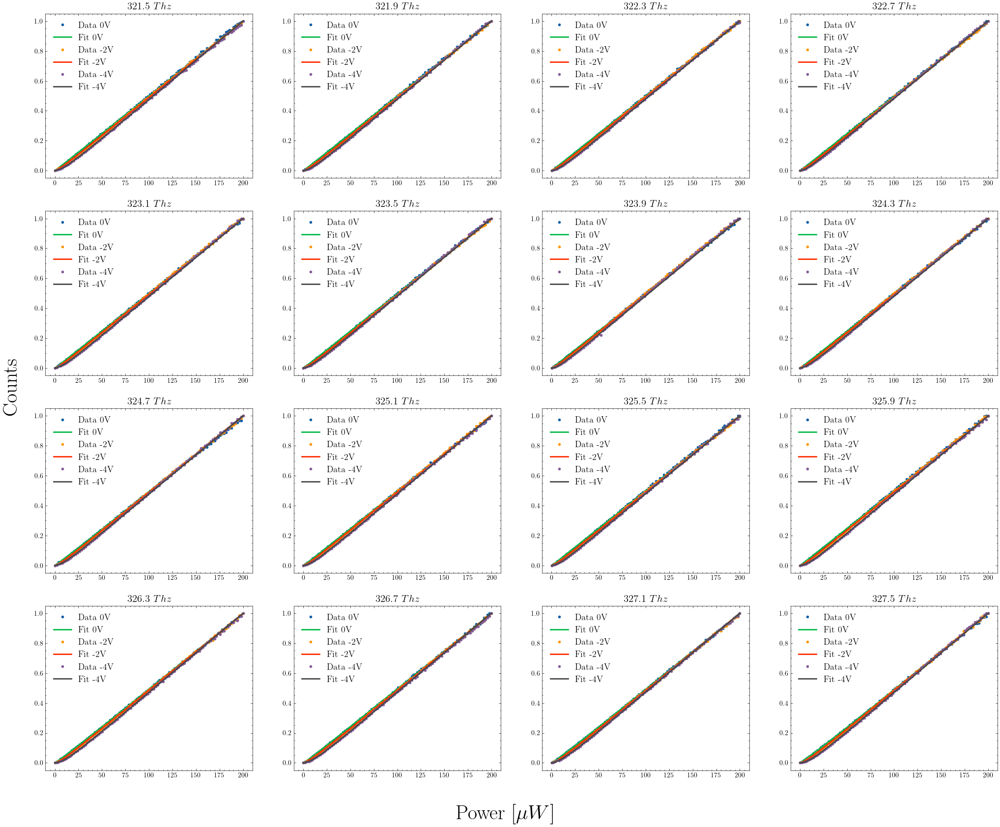

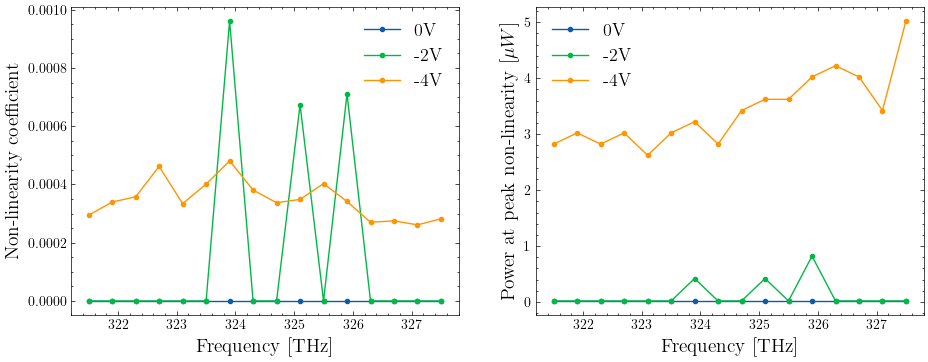

In [78]:
for resistance in resistances:
    print(f"PLOTS FOR RESISTANCE {resistance:,}")
    inputs, results, nl_coeffs, nl_pows = pf_power_counts_fit(data_dict, resistance, voltages, powerlist)

    # inputs_0V, inputs_m2V, inputs_m4V = inputs
    # results_0V, results_m2V, results_m4V = results
    nl_coeffs_0V, nl_coeffs_m2V, nl_coeffs_m4V = nl_coeffs
    nl_pows_0V, nl_pows_m2V, nl_pows_m4V = nl_pows

    linspace = np.linspace(np.min(powerlist), np.max(powerlist), 1000)

    plot_power_counts_with_fit(inputs, results, voltages)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 4))
    ax1.plot(freqlist[::2], nl_coeffs_0V, '.-', label="0V")
    ax1.plot(freqlist[::2], nl_coeffs_m2V, '.-', label="-2V")
    ax1.plot(freqlist[::2], nl_coeffs_m4V, '.-', label="-4V")
    ax1.set_xlabel(r"Frequency [THz]", fontsize=14)
    ax1.set_ylabel("Non-linearity coefficient", fontsize=14)
    ax1.legend(frameon=False, fontsize=13)

    ax2.plot(freqlist[::2], nl_pows_0V, '.-', label="0V")
    ax2.plot(freqlist[::2], nl_pows_m2V, '.-', label="-2V")
    ax2.plot(freqlist[::2], nl_pows_m4V, '.-', label="-4V")
    ax2.set_xlabel(r"Frequency [THz]", fontsize=14)
    ax2.set_ylabel("Power at peak non-linearity [$\mu W$]", fontsize=14)
    ax2.legend(frameon=False, fontsize=13)

    plt.show()
